In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
from shapely.ops import nearest_points

import seaborn as sns

from mpl_toolkits.axes_grid1 import make_axes_locatable

import math

import time

from matplotlib import cm

import matplotlib.lines as mlines

%matplotlib inline

### AIR POLLUTION MONITORING DATA FROM EDF

In [111]:
df = pd.read_csv('EDF_Data.csv', header = 1)
df['TimePeriod'] = 'Jun2015-May2016'
df.tail()

,Longitude,Latitude,NO Value,NO2 Value,BC Value,TimePeriod
21483,-122.034943,37.560076,129.999995,44.778220,3.923761,Jun2015-May2016
21484,-122.034724,37.560164,60.799998,39.027545,1.408693,Jun2015-May2016
21485,-122.034681,37.559830,34.622951,28.816797,2.659885,Jun2015-May2016
21486,-122.034504,37.559958,74.764705,35.735434,1.776353,Jun2015-May2016
21487,-122.034503,37.559957,78.754782,41.062757,2.014664,Jun2015-May2016


In [112]:
df.shape

(21488, 6)

In [113]:
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]

### Split the dataset into BC and NO2 since we are interested only in those two pollutants

In [114]:
BC_df = df[['Longitude', 'Latitude', 'BC Value', 'TimePeriod']]

In [115]:
NO2_df = df[['Longitude', 'Latitude', 'NO2 Value', 'TimePeriod']]

In [116]:
crs = {'init': 'epsg:4326'}
geo_df = gpd.GeoDataFrame(df, crs = crs, geometry = geometry)

### FACILITY LEVEL DATA

In [117]:
Facility_PM = pd.read_csv("Data/All_PM_Facilities_Final.csv")

In [118]:
Facility_PM.drop(columns = ['Unnamed: 0'], inplace=True)

In [119]:
Facility_PM.tail()

,eis facility id,company,source-category,latitude,longitude,city,PM25,PM10,units,source-type
343,18776511,Unknown,Manufacturing,37.853018,-122.292710,BERKELEY,0.010500,0.010500,TON,Manufacturing
344,18778911,Unknown,Wholesale,37.712960,-122.188680,SAN-LEANDRO,22.124544,22.971518,TON,Wholesale
345,18779811,Unknown,Manufacturing,37.707820,-122.185500,SAN-LEANDRO,0.000015,0.000015,TON,Manufacturing
346,18782611,Unknown,Waste-Recycling,37.759959,-122.207782,OAKLAND,0.992654,1.030213,TON,Waste-Recycling
347,18787011,Unknown,Manufacturing,37.766939,-122.216336,OAKLAND,0.079014,0.131690,TON,Manufacturing


## Converting facility and traffic dataframe into a geopandas dataframe for plotting

In [120]:
# Create a list of x and y coordinates for the PM facility data in Oakland using geopandas
geometry_facility_PM = [Point(xy) for xy in zip(Facility_PM['longitude'], Facility_PM['latitude'])]
geo_df_facility_PM = gpd.GeoDataFrame(Facility_PM, crs = crs, geometry = geometry_facility_PM)

In [121]:
# Create a list of x and y coordinates for the Black Carbon concentration data using geopandas
geometry_df_BC = [Point(xy) for xy in zip(BC_df['Longitude'], BC_df['Latitude'])]
geo_df_BC = gpd.GeoDataFrame(BC_df, crs = crs, geometry = geometry_df_BC)

### Combining Air Pollution Monitoring Data and Facility level data

In [122]:
Facility_PM_All = Facility_PM.copy()

In [123]:
Facility_PM.shape

(348, 11)

In [124]:
Facility_PM.describe()

,eis facility id,latitude,longitude,PM25,PM10
count,3.480000e+02,348.000000,348.000000,3.480000e+02,3.480000e+02
mean,1.166156e+07,37.785381,-122.239371,4.811451e-01,6.368840e-01
std,6.447159e+06,0.053832,0.052052,2.289948e+00,2.978462e+00
min,1.269110e+05,37.674500,-122.319375,4.000000e-09,5.000000e-09
25%,1.046049e+07,37.742283,-122.278356,1.342943e-04,1.438983e-04
50%,1.381861e+07,37.795385,-122.259050,6.924440e-04,7.594420e-04
75%,1.724714e+07,37.817870,-122.196720,2.344960e-02,2.608391e-02
max,1.878701e+07,37.888535,-122.107740,2.212454e+01,2.626146e+01


In [125]:
Facility_PM.head()

,eis facility id,company,source-category,latitude,longitude,city,PM25,PM10,units,source-type,geometry
0,126911,PACIFIC-BELL,Institution,37.76685,-122.24972,ALAMEDA,0.000731,0.000749,TON,Institution,POINT (-122.24972 37.76685)
1,127111,PACIFIC-BELL,Institution,37.86771,-122.26784,BERKELEY,0.002173,0.002226,TON,Institution,POINT (-122.26784 37.86771)
2,127511,PACIFIC-BELL,Institution,37.80603,-122.26946,OAKLAND,0.008291,0.008494,TON,Institution,POINT (-122.26946 37.80603)
3,127611,PACIFIC-BELL,Institution,37.78422,-122.22241,OAKLAND,0.000706,0.000724,TON,Institution,POINT (-122.22241 37.78422)
4,127711,PACIFIC-BELL,Institution,37.83336,-122.26307,OAKLAND,0.001554,0.001592,TON,Institution,POINT (-122.26307 37.83336)


In [126]:
### Create a columns as eis-source-type
Facility_PM['eis-source'] = Facility_PM['eis facility id'].apply(str) + '-' + Facility_PM['source-type']

In [127]:
### Add an empty column for distance
Facility_PM['dist'] = 0
Facility_PM['dist'].astype(float)

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
343    0.0
344    0.0
345    0.0
346    0.0
347    0.0
Name: dist, Length: 348, dtype: float64

### Add a column for emissions/distance since concentration is directly proportional to emissions and inversely proportional to distance from soure

In [1]:
Facility_PM['emsdist'] = 0
Facility_PM['emsdist'].astype(float)

NameError: name 'Facility_PM' is not defined

#### Create a dataframe where each column is one of the industrial facilities, with columns as latitude, longitude, PM2.5 emissions value and geometry. Dropping PM10 emissions since Black Carbon is a form on PM2.5 emissions

In [129]:
Oak_PM_lat = Facility_PM[['eis-source', 'latitude']]
Oak_PM_long = Facility_PM[['eis-source', 'longitude']]
Oak_PM_PM25 = Facility_PM[['eis-source', 'PM25']]
Oak_PM_dist = Facility_PM[['eis-source', 'dist']]
Oak_PM_emsdist = Facility_PM[['eis-source', 'emsdist']]
Oak_PM_geo = Facility_PM[['eis-source', 'geometry']]


In [130]:
# Transpose all the dataframes
Oak_PM_lat = Oak_PM_lat.T
Oak_PM_long = Oak_PM_long.T
Oak_PM_PM25 = Oak_PM_PM25.T
#Oak_PM_PM10 = Oak_PM_PM10.T
Oak_PM_dist = Oak_PM_dist.T
Oak_PM_emsdist = Oak_PM_emsdist.T
Oak_PM_geo = Oak_PM_geo.T

In [2]:
## Make the header as the first row in each transposed dataframe
Oak_PM_lat = Oak_PM_lat.rename(columns=Oak_PM_lat.iloc[0]).drop(Oak_PM_lat.index[0])
Oak_PM_long = Oak_PM_long.rename(columns=Oak_PM_long.iloc[0]).drop(Oak_PM_long.index[0])
Oak_PM_PM25 = Oak_PM_PM25.rename(columns=Oak_PM_PM25.iloc[0]).drop(Oak_PM_PM25.index[0])
#Oak_PM_PM10 = Oak_PM_PM10.rename(columns=Oak_PM_PM10.iloc[0].astype(int)).drop(Oak_PM_PM10.index[0])
Oak_PM_dist = Oak_PM_dist.rename(columns=Oak_PM_dist.iloc[0]).drop(Oak_PM_dist.index[0])
Oak_PM_emsdist = Oak_PM_emsdist.rename(columns=Oak_PM_emsdist.iloc[0]).drop(Oak_PM_emsdist.index[0])
Oak_PM_geo = Oak_PM_geo.rename(columns=Oak_PM_geo.iloc[0]).drop(Oak_PM_geo.index[0])

NameError: name 'Oak_PM_lat' is not defined

In [132]:
## Add suffix to column header based on the dataframe type
Oak_PM_lat.columns = [str(col) + '_latitude' for col in Oak_PM_lat.columns]
Oak_PM_long.columns = [str(col) + '_longitude' for col in Oak_PM_long.columns]
Oak_PM_PM25.columns = [str(col) + '_PM25' for col in Oak_PM_PM25.columns]
#Oak_PM_PM10.columns = [str(col) + '_PM10' for col in Oak_PM_PM10.columns]
Oak_PM_dist.columns = [str(col) + '_dist' for col in Oak_PM_dist.columns]
Oak_PM_emsdist.columns = [str(col) + '_emsdist' for col in Oak_PM_emsdist.columns]
Oak_PM_geo.columns = [str(col) + '_geo' for col in Oak_PM_geo.columns]

In [133]:
## Remove index for each dataframe
Oak_PM_lat.reset_index(drop=True, inplace=True)
Oak_PM_long.reset_index(drop=True, inplace=True)
Oak_PM_PM25.reset_index(drop=True, inplace=True)
#Oak_PM_PM10.reset_index(drop=True, inplace=True)
Oak_PM_dist.reset_index(drop=True, inplace=True)
Oak_PM_emsdist.reset_index(drop=True, inplace=True)
Oak_PM_geo.reset_index(drop=True, inplace=True)

In [134]:
Oak_PM_combined = Oak_PM_lat.join(Oak_PM_long).join(Oak_PM_PM25).join(Oak_PM_dist).join(Oak_PM_emsdist).join(Oak_PM_geo)


In [135]:
Oak_PM_combined

,126911-Institution_latitude,127111-Institution_latitude,127511-Institution_latitude,127611-Institution_latitude,127711-Institution_latitude,127811-Institution_latitude,128211-Institution_latitude,130511-Institution_latitude,136511-EGen_latitude,137211-Institution_latitude,...,18697311-Retail_geo,18697911-Wholesale_geo,18698311-Metals_geo,18705211-Waste-Recycling_geo,18776211-Manufacturing_geo,18776511-Manufacturing_geo,18778911-Wholesale_geo,18779811-Manufacturing_geo,18782611-Waste-Recycling_geo,18787011-Manufacturing_geo
0,37.7668,37.8677,37.806,37.7842,37.8334,37.8119,37.7001,37.7605,37.7868,37.8227,...,POINT (-122.178222 37.714556),POINT (-122.190515 37.744311),POINT (-122.18159 37.71716),POINT (-122.208693 37.760758),POINT (-122.17814 37.707579),POINT (-122.29271 37.853018),POINT (-122.18868 37.71296),POINT (-122.1855 37.70782),POINT (-122.207782 37.759959),POINT (-122.216336 37.766939)


In [136]:
Oak_PM_combined = Oak_PM_combined.reindex(columns=sorted(Oak_PM_combined.columns))

In [137]:
Oak_PM_combined

,10452611-Metals_PM25,10452611-Metals_dist,10452611-Metals_emsdist,10452611-Metals_geo,10452611-Metals_latitude,10452611-Metals_longitude,10452911-Institution_PM25,10452911-Institution_dist,10452911-Institution_emsdist,10452911-Institution_geo,...,808611-AsphaltPlant_emsdist,808611-AsphaltPlant_geo,808611-AsphaltPlant_latitude,808611-AsphaltPlant_longitude,808811-FoodPlant_PM25,808811-FoodPlant_dist,808811-FoodPlant_emsdist,808811-FoodPlant_geo,808811-FoodPlant_latitude,808811-FoodPlant_longitude
0,4e-09,0,0,POINT (-122.26765 37.81329),37.8133,-122.268,0.051645,0,0,POINT (-122.23476 37.74567),...,0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0,0,POINT (-122.26824 37.79355),37.7936,-122.268


In [138]:
#Create a datafram where each row contains emissions of PM2.5 for each facility
Oak_PM_combined = Oak_PM_combined.loc[Oak_PM_combined.index.repeat(21488)].reset_index(drop=True)

In [139]:
BC_Facility = BC_df.join(Oak_PM_combined)

In [143]:
# Convert distance or emissions distance column to float type
for idx, col in enumerate(BC_Facility.columns):
        if "_dist" in col:
            BC_Facility[col] = pd.to_numeric(BC_Facility[col], downcast="float")


In [144]:
# Convert distance or emissions distance column to float type
for idx, col in enumerate(BC_Facility.columns):
        if "_emsdist" in col:
            BC_Facility[col] = pd.to_numeric(BC_Facility[col], downcast="float")


### Calculate distance between point of measurement and each facility and add it to the _dist column

In [145]:
### Defining a function to calculate the distance between two GPS coordinates (latitude and longitude)
def distance(origin, destination):
    lat1, lon1 = origin
    lat2, lon2 = destination
    radius = 6371 # km

    dlat = math.radians(lat2-lat1)
    dlon = math.radians(lon2-lon1)
    a = math.sin(dlat/2) * math.sin(dlat/2) + math.cos(math.radians(lat1)) \
        * math.cos(math.radians(lat2)) * math.sin(dlon/2) * math.sin(dlon/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    d = radius * c

    return d

In [146]:
BC_Facility.head()

,Longitude,Latitude,BC Value,TimePeriod,geometry,10452611-Metals_PM25,10452611-Metals_dist,10452611-Metals_emsdist,10452611-Metals_geo,10452611-Metals_latitude,...,808611-AsphaltPlant_emsdist,808611-AsphaltPlant_geo,808611-AsphaltPlant_latitude,808611-AsphaltPlant_longitude,808811-FoodPlant_PM25,808811-FoodPlant_dist,808811-FoodPlant_emsdist,808811-FoodPlant_geo,808811-FoodPlant_latitude,808811-FoodPlant_longitude
0,-122.322594,37.806781,0.818032,Jun2015-May2016,POINT (-122.32259 37.80678),4e-09,0.0,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0.0,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
1,-122.322310,37.806150,0.551475,Jun2015-May2016,POINT (-122.32231 37.80615),4e-09,0.0,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0.0,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
2,-122.322301,37.806420,0.593712,Jun2015-May2016,POINT (-122.32230 37.80642),4e-09,0.0,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0.0,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
3,-122.322299,37.805880,0.489898,Jun2015-May2016,POINT (-122.32230 37.80588),4e-09,0.0,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0.0,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
4,-122.322267,37.806689,0.739341,Jun2015-May2016,POINT (-122.32227 37.80669),4e-09,0.0,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,0.0,0.0,POINT (-122.26824 37.79355),37.7936,-122.268


### Calculating distance between each industrial facility and the point of measurement. 


##### The first method I tried was to iterate through all the columns, identify the columns with "_dist" as suffix, then iterate through rows to calcualte distance using the dist function. But this method took 47 seconds just for 1,000 rows. 

In [148]:
time3 = time.time()
for idx, col in enumerate(BC_Facility.columns):
    if "_dist" in col:
        for index, row in BC_Facility.head(1000).iterrows():
            BC_Facility.at[index,col] = float(distance((row.iloc[1], row.iloc[0]), (row.iloc[idx+3], row.iloc[idx+4])))*0.621
time4 = time.time()

print(time4 - time3)

KeyboardInterrupt: 

##### In the second method, I iterate through all rows, identify the rows with "_dist" as column headers, and then calculate distance using distance function

In [149]:
time1 = time.time()
for index, row in BC_Facility.iterrows():
    for idx, col in enumerate(BC_Facility.columns):
        if "_dist" in col:
            BC_Facility.at[index,col] = float(distance((row.iloc[1], row.iloc[0]), (row.iloc[idx+3], row.iloc[idx+4])))*0.621
            #BC_Facility.at[index,col] = float(row.iloc[idx])
time2 = time.time()            
    
print(time2 - time1)


270.35911536216736


In [151]:
BC_Facility.head()

,Longitude,Latitude,BC Value,TimePeriod,geometry,10452611-Metals_PM25,10452611-Metals_dist,10452611-Metals_emsdist,10452611-Metals_geo,10452611-Metals_latitude,...,808611-AsphaltPlant_emsdist,808611-AsphaltPlant_geo,808611-AsphaltPlant_latitude,808611-AsphaltPlant_longitude,808811-FoodPlant_PM25,808811-FoodPlant_dist,808811-FoodPlant_emsdist,808811-FoodPlant_geo,808811-FoodPlant_latitude,808811-FoodPlant_longitude
0,-122.322594,37.806781,0.818032,Jun2015-May2016,POINT (-122.32259 37.80678),4e-09,3.030941,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,3.103170,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
1,-122.322310,37.806150,0.551475,Jun2015-May2016,POINT (-122.32231 37.80615),4e-09,3.022442,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,3.075784,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
2,-122.322301,37.806420,0.593712,Jun2015-May2016,POINT (-122.32230 37.80642),4e-09,3.018953,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,3.080629,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
3,-122.322299,37.805880,0.489898,Jun2015-May2016,POINT (-122.32230 37.80588),4e-09,3.024943,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,3.069979,0.0,POINT (-122.26824 37.79355),37.7936,-122.268
4,-122.322267,37.806689,0.739341,Jun2015-May2016,POINT (-122.32227 37.80669),4e-09,3.014269,0.0,POINT (-122.26765 37.81329),37.8133,...,0.0,POINT (-122.30178 37.86982),37.8698,-122.302,0.590966,3.084273,0.0,POINT (-122.26824 37.79355),37.7936,-122.268


In [3]:
### Write this to a dataframe
BC_Facility.to_csv("Data/BC_Facility_Dist_ALL.csv")

NameError: name 'BC_Facility' is not defined

### Calculate a column as emission PM25 / Dist to use as the feature in the model

In [154]:
time1 = time.time()
for index, row in BC_Facility.iterrows():
    for idx, col in enumerate(BC_Facility.columns):
        if "_emsdist" in col:
            try:
                BC_Facility.at[index,col] = (row.iloc[idx-2]/row.iloc[idx-1])
            except ZeroDivisionError:
                BC_Facility.at[index,col] = 0
time2 = time.time()            
    
print(time2 - time1)


157.45495772361755


In [155]:
### Write this to a dataframe
BC_Facility.to_csv("Data/BC_Facility_EmsDist_ALL.csv")

##### Drop latitude, longitude and emissions since we don't need those columns. Latitude and longitude values are captured in the distance column. Since all the emissions values are the same, that feature would not be important

In [158]:
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('_dist', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('_PM25', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('_latitude', case=False)]
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('_longitude', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('_geo', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('geometry', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('Longitude', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('Latitude', case=False)] 
BC_Facility = BC_Facility.loc[:,~BC_Facility.columns.str.contains('TimePeriod', case=False)] 

In [10]:
BC_Facility['14241511-Institution_emsdist']

0        0.075924
1        0.076470
2        0.076430
3        0.076538
4        0.076422
           ...   
21483    0.010165
21484    0.010163
21485    0.010154
21486    0.010154
21487    0.010154
Name: 14241511-Institution_emsdist, Length: 21488, dtype: float64

In [160]:
### Write this to a dataframe
BC_Facility.to_csv("Data/BC_Facility_EmsDist_Inputs.csv")

In [2]:
BC_Facility = pd.read_csv("Data/BC_Facility_EmsDist_Inputs.csv")

In [3]:
corr_BC_Facility = BC_Facility.corr()
arr_corr= corr_BC_Facility.as_matrix()

/home/shridhar/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


In [4]:
corr_BC_Facility_pearson = BC_Facility.corr(method = 'pearson')


In [7]:
corr_BC_Facility_pearson['14241511-Institution_emsdist']

Unnamed: 0                      0.001922
BC Value                       -0.008945
10452611-Metals_emsdist         0.035048
10452911-Institution_emsdist   -0.012416
10453011-WWTP_emsdist          -0.012249
                                  ...   
7845611-Institution_emsdist     0.048049
7845711-Crematory_emsdist       0.047921
804911-FoodPlant_emsdist       -0.044068
808611-AsphaltPlant_emsdist     0.046624
808811-FoodPlant_emsdist        0.048060
Name: 14241511-Institution_emsdist, Length: 350, dtype: float64

module://ipykernel.pylab.backend_inline


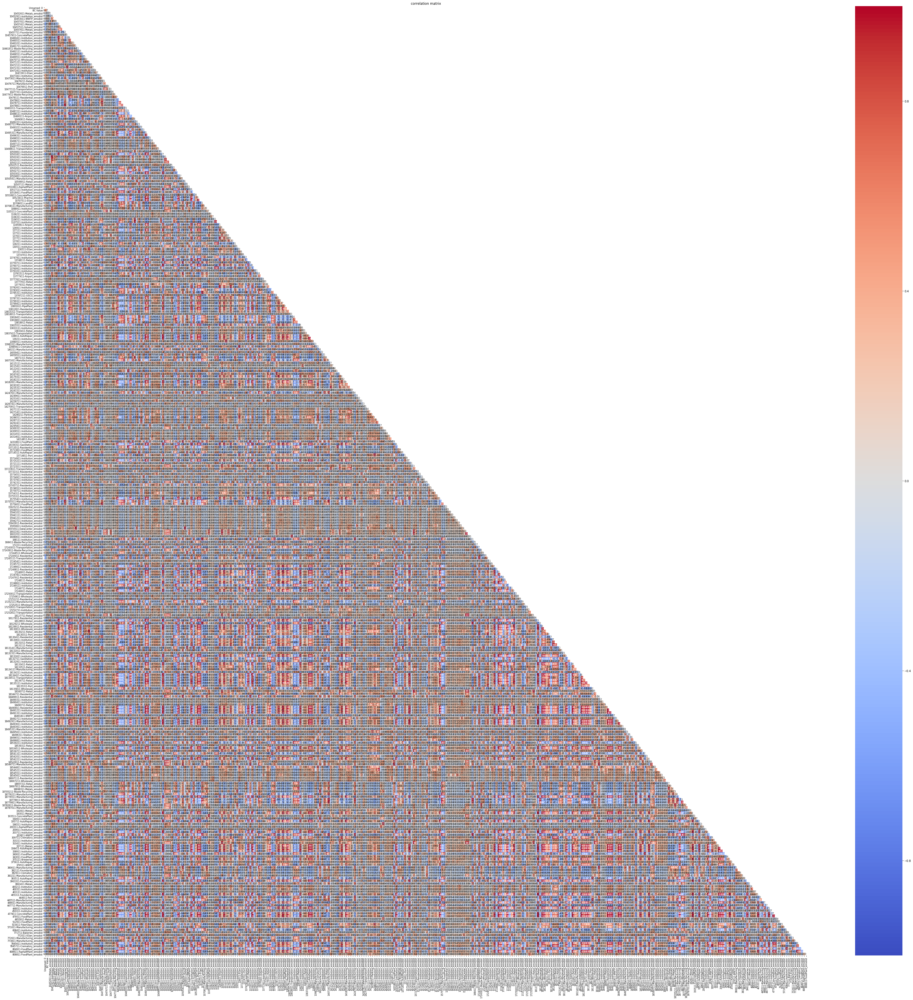

In [6]:
print(plt.get_backend())

# close any existing plots
plt.close("all")

# mask out the top triangle
arr_corr[np.triu_indices_from(arr_corr)] = np.nan

fig, ax = plt.subplots(figsize=(50, 50))

hm = sns.heatmap(arr_corr, cbar=True, vmin = -1, vmax = 1, center = 0,
                 fmt='.2f', annot_kws={'size': 8}, annot=True, 
                 square=False, cmap = 'coolwarm')
#cmap=plt.cm.Blues

ticks = np.arange(corr_BC_Facility.shape[0]) + 0.5
ax.set_xticks(ticks)
ax.set_xticklabels(corr_BC_Facility.columns, rotation=90, fontsize=8)
ax.set_yticks(ticks)
ax.set_yticklabels(corr_BC_Facility.index, rotation=360, fontsize=8)

ax.set_title('correlation matrix')
plt.tight_layout()
#plt.savefig("corr_matrix_incl_anno_double.png", dpi=300)

#### Based on the above heatmap, there seems to be only a small correlation between distance to industrial facilities and the BC concentartion measured at a given point. A small correlation indicates that there could be other factors that are contributing to BC measurements at a given point. This could also indicate that most of the meseasurement are from traffic, thus looking into location of all traffic intersections would be helpful.  